## E19 - 흐린 사진을 선명하게

저해상도의 이미지를 고해상도의 이미지로 변환하는 기술은 CNN보다 GAN이 더 효과적이다.   
Super resolution: 저해상도 영상을 고해상도 영상으로 변환하는 작업   
저해상도 영상을 빠르게 받아서 고해상도의 영상으로 변환해서 본다??   
드라마 리마스터링(HD->UHD, 노이즈 제거), 의료영상, 자동차 번호판, CCTV   

Super resolution을 저해하는 요인   
1. 하나의 저해상도 이미지에서 다양한 고해상도의 이미지를 얻을 수 있다. ill-posed (Inverse) problem   
일반적인 Super resolution학습 과정은 고해상도의 이미지를 저해상도의 이미지를 생성, 다시 고해상도의 이미지로 복원으로 진행된다.   
2. Super resolution문제의 복잡도   
해상도가 높을수록 생성해야할 픽셀 수가 많아진다. 2x2 -> 3x3(5개), 4x4(12개), 5x5(21개)  
생성해야할 픽셀 수가 많을수록 그만큼 잘못된 정보를 만들어 낼 가능성이 높다.   
3. 정량적 평가 척도와 사람이 느끼는 정도가 다르다는 점

### Super resolution을 수행하는 방법
1. Interpolation   
선형보간법과 쌍선형보간법 https://bskyvision.com/789   
쌍선형보간법 간단한 계산 과정 http://blog.naver.com/dic1224/220882679460   

(300, 451, 3)


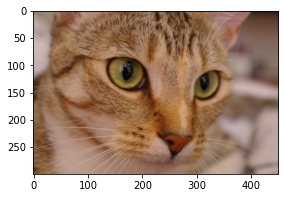

In [1]:
# opencv에서 보간법 사용해보기

from skimage import data
import matplotlib.pyplot as plt

hr_image = data.chelsea() # skimage에서 제공하는 예제 이미지를 불러옵니다.
hr_shape = hr_image.shape[:2]

print(hr_image.shape) # 이미지의 크기를 출력합니다.

plt.figure(figsize=(6,3))
plt.imshow(hr_image)
plt.show()

(100, 150, 3)


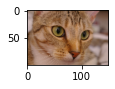

In [2]:
# 이미지 크기를 줄여서 저해상도의 이미지로 만들기

import cv2
lr_image = cv2.resize(hr_image, dsize=(150,100)) # (가로 픽셀 수, 세로 픽셀 수), 크기 지정해야함

print(lr_image.shape)

plt.figure(figsize=(3,1))
plt.imshow(lr_image)
plt.show()

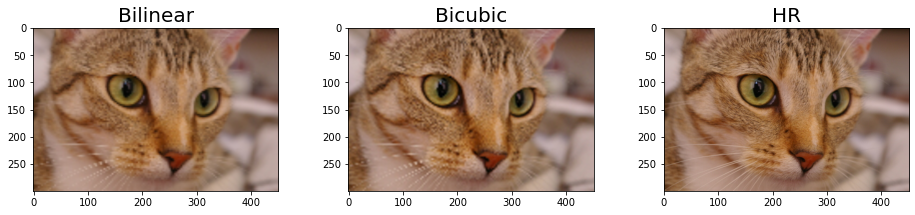

In [3]:
# bilinear 및 bicubic interpolation 적용하여 이미지를 키우기

bilinear_image = cv2.resize(
    lr_image, 
    dsize=(451, 300), # (가로 픽셀 수, 세로 픽셀 수) 
    interpolation=cv2.INTER_LINEAR # bilinear interpolation 적용
)

bicubic_image = cv2.resize(
    lr_image, 
    dsize=(451, 300), # (가로 픽셀 수, 세로 픽셀 수)
    interpolation=cv2.INTER_CUBIC # bicubic interpolation 적용
)

images = [bilinear_image, bicubic_image, hr_image]
titles = ["Bilinear", "Bicubic", "HR"]

plt.figure(figsize=(16,3))
for i, (image, title) in enumerate(zip(images, titles)):
    plt.subplot(1,3,i+1)
    plt.imshow(image)
    plt.title(title, fontsize=20)
    
# https://docs.opencv.org/master/da/d54/group__imgproc__transform.html#ga5bb5a1fea74ea38e1a5445ca803ff121

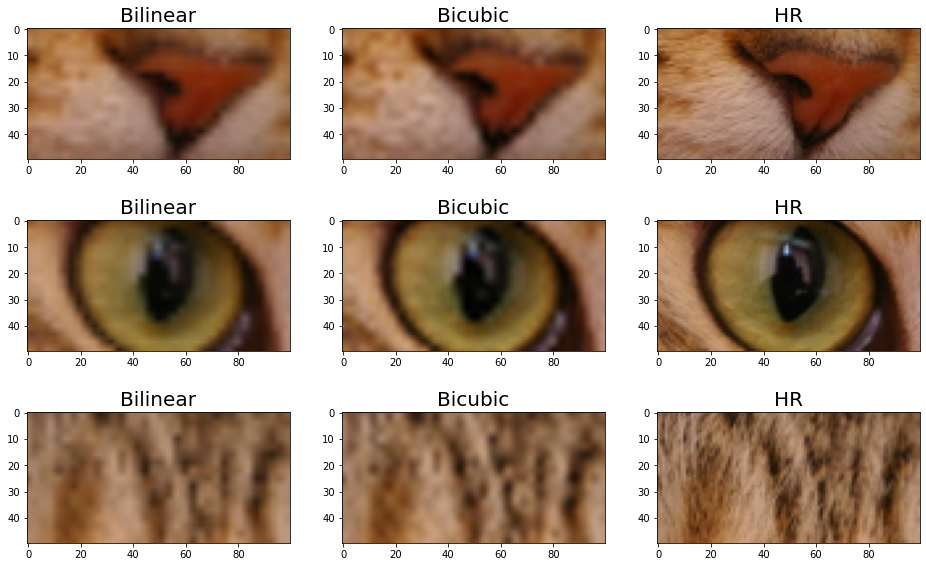

In [4]:
# 특정 영역을 잘라낼 함수를 정의합니다.
def crop(image, left_top, x=50, y=100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]


# 잘라낼 영역의 좌표를 정의합니다.
left_tops = [(220,200)] *3 + [(90,120)] *3 + [(30,200)] *3

plt.figure(figsize=(16,10))
for i, (image, left_top, title) in enumerate(zip(images*3, left_tops, titles*3)):
    plt.subplot(3,3,i+1)
    plt.imshow(crop(image, left_top))
    plt.title(title, fontsize=20)

### Deep learning을 이용한 Super resolution, SRCNN

"Image Super-Resolution Using Deep Convolutional Networks, 2014" 논문에서 사용됨.   
저해상도의 이미지를 bicubic interpolation으로 크기를 키워서   
이 이미지를 입력으로 하고 3개의 conv를 거쳐 고해상도의 이미지를 생성한다.   

SRCNN이후의 연구 결과   
VDSR(Very Deep Super Resolution): 20개의 conv, 마지막에 처음 입력이미지를 residual learning   
RDN(Residual Dense Network): 각 conv의 출력을 이용, 출력 결과 이후 모든 단계conv연산에 재활용   
RCAN(Residual Channel Attention Networks): cnn attenstion이용, conv결과의 특징 맵에서 중요 채널에만 선택적으로 집중하도록 함.   

데이터는 tensorflow-datasets라이브러리에 있는 DIV2K이며 super resolution연구에 많이 사용됨.   
사용할 데이터는 div2k/bicubic_x4이며 실제 고해상도 이미지를 bicubic interpolation을 이용하여 1/4배로 줄인 데이터셋.   
저해상도 이미지와 원래 고해상도 이미지, 한 쌍으로 구성.
https://data.vision.ee.ethz.ch/cvl/DIV2K/

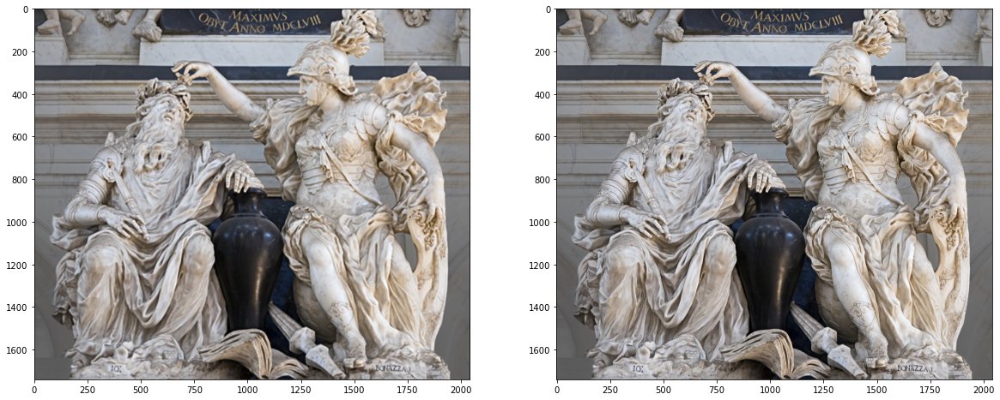

In [5]:
# 데이터 준비하기 

import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

# 데이터를 불러옵니다.
train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True
)

# 시각화를 위해 한 개의 데이터만 선택합니다.
for i, (lr, hr) in enumerate(valid):
    if i == 6: break
    
# 저해상도 이미지를 고해상도 이미지 크기로 bicubic interpolation 합니다.  
hr, lr = np.array(hr), np.array(lr)
bicubic_hr = cv2.resize(
    lr, 
    dsize=(hr.shape[1], hr.shape[0]), # 고해상도 이미지 크기로 설정
    interpolation=cv2.INTER_CUBIC # bicubic 설정
)

# 저해상도 및 고해상도 이미지를 시각화 합니다.
plt.figure(figsize=(20,10))
plt.subplot(1,2,1); plt.imshow(bicubic_hr)
plt.subplot(1,2,2); plt.imshow(hr)
plt.show()

Text(0.5, 1.0, 'HR')

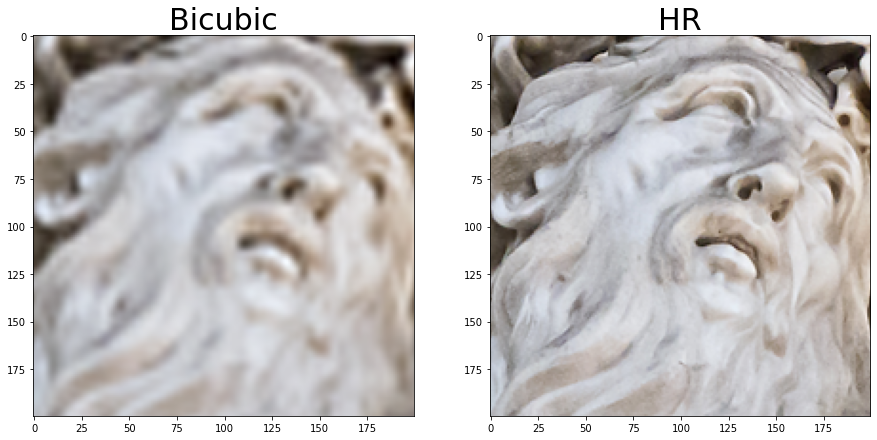

In [6]:
# 특정 위치를 확대해서 보자

# 이미지의 특정 부분을 잘라내는 함수를 정의합니다.
def crop(image, left_top, x=200, y=200):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

# interpolation된 이미지와 고해상도 이미지의 동일한 부분을 각각 잘라냅니다.
left_top = (400, 500)
crop_bicubic_hr = crop(bicubic_hr, left_top)
crop_hr = crop(hr, left_top)

# 잘라낸 부분을 시각화 합니다.
plt.figure(figsize=(15,25))
plt.subplot(1,2,1); plt.imshow(crop_bicubic_hr); plt.title("Bicubic", fontsize=30)
plt.subplot(1,2,2); plt.imshow(crop_hr); plt.title("HR", fontsize=30)

In [7]:
# SRCNN을 이용하여 고해상도 이미지를 만들어보자.
# 입력 이미지 만들기

import tensorflow as tf

def preprocessing(lr, hr):
    # 이미지의 크기가 크므로 (96,96,3) 크기로 임의 영역을 잘라내어 사용합니다.
    hr = tf.image.random_crop(hr, size=[96, 96, 3])
    hr = tf.cast(hr, tf.float32) / 255.
    
    # 잘라낸 고해상도 이미지의 가로, 세로 픽셀 수를 1/4배로 줄였다가
    # interpolation을 이용해 다시 원래 크기로 되돌립니다.
    # 이렇게 만든 저해상도 이미지를 입력으로 사용합니다.
    lr = tf.image.resize(hr, [96//4, 96//4], "bicubic")
    lr = tf.image.resize(lr, [96, 96], "bicubic")
    return lr, hr

train = train.map(preprocessing).shuffle(buffer_size=10).batch(16)
valid = valid.map(preprocessing).batch(16)
print("✅")

✅


In [8]:
from tensorflow.keras import layers, Sequential

# 3개의 convolutional layer를 갖는 Sequential 모델을 구성합니다.
srcnn = Sequential()
# 9x9 크기의 필터를 128개 사용합니다.
srcnn.add(layers.Conv2D(128, 9, padding="same", input_shape=(None, None, 3)))
srcnn.add(layers.ReLU())
# 5x5 크기의 필터를 64개 사용합니다.
srcnn.add(layers.Conv2D(64, 5, padding="same"))
srcnn.add(layers.ReLU())
# 5x5 크기의 필터를 64개 사용합니다.
srcnn.add(layers.Conv2D(3, 5, padding="same"))

srcnn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, None, None, 128)   31232     
_________________________________________________________________
re_lu (ReLU)                 (None, None, None, 128)   0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    204864    
_________________________________________________________________
re_lu_1 (ReLU)               (None, None, None, 64)    0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 3)     4803      
Total params: 240,899
Trainable params: 240,899
Non-trainable params: 0
_________________________________________________________________


In [9]:
# SRCNN 학습하기

srcnn.compile(
    optimizer="adam", 
    loss="mse"
)

srcnn.fit(train, validation_data=valid, epochs=1)

50/50 [==============================] - 17s 331ms/step - loss: 0.0415 - val_loss: 0.0108


In [10]:
# SRCNN 테스트하기
# 모델 학습에 많은 시간이 소요되므로 이미 학습이 완료된 모델을 이용한다.

# mkdir -p ~/aiffel/super_resolution
# wget https://aiffelstaticprd.blob.core.windows.net/media/documents/srcnn.h5
# mv srcnn.h5 ~/aiffel/super_resolution

import tensorflow as tf
import os

model_file = os.getenv('HOME')+'/aiffel/super_resolution/srcnn.h5'
srcnn = tf.keras.models.load_model(model_file)

In [11]:
# 저해상도의 이미지를 입력받아 SRCNN을 사용하는 함수

def apply_srcnn(image):
    sr = srcnn.predict(image[np.newaxis, ...]/255.)
    sr[sr > 1] = 1
    sr[sr < 0] = 0
    sr *= 255.
    return np.array(sr[0].astype(np.uint8))

srcnn_hr = apply_srcnn(bicubic_hr)

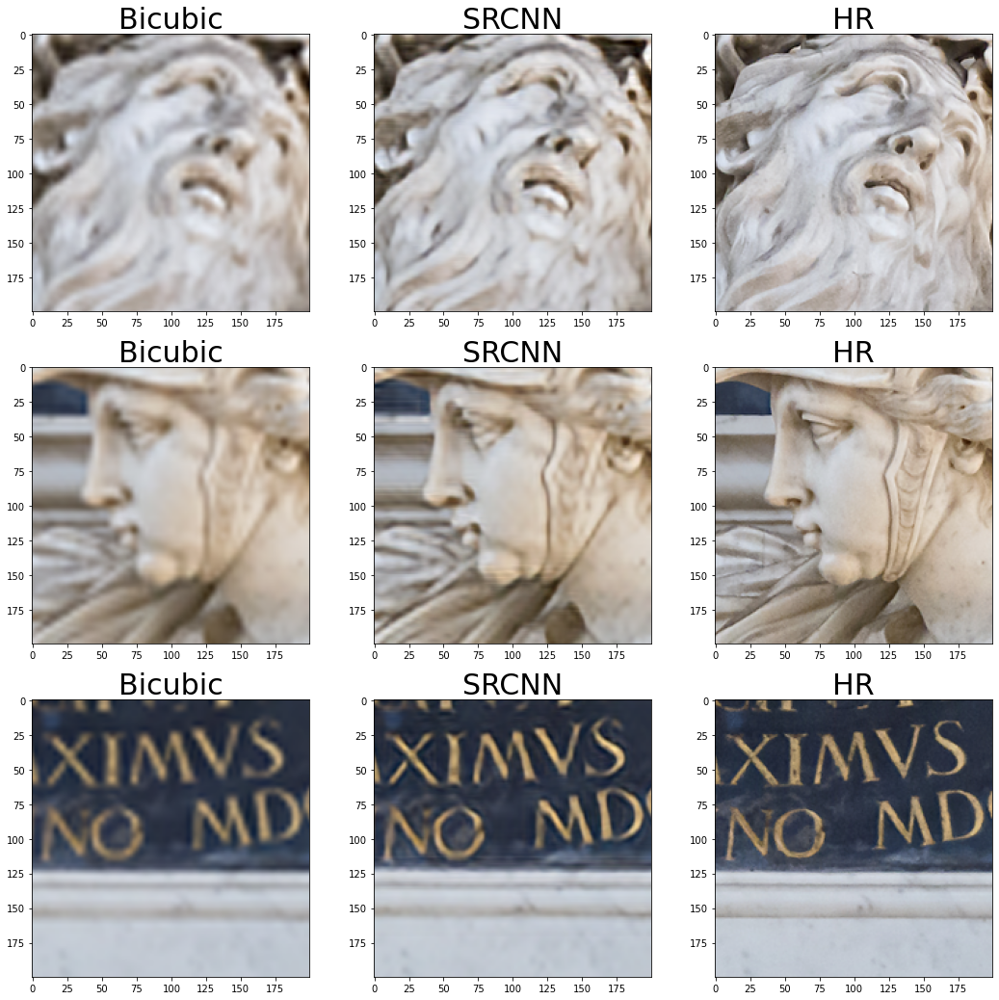

In [12]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(400,500), (300,1200), (0,1000)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 200, 200)
    img2 = crop(srcnn_hr , left_top, 200, 200)
    img3 = crop(hr, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRCNN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

### Deep Learning을 이용한 Super Resolution, SRGAN

"Photo-Realistic Single Image Super-Resolution Using a Generative Adversarial Network, 2016"   
perceptual loss = content loss + adversarial loss(GAN의 loss)   
content loss: 생성자가 만든 가짜 이미지를 실제 고해상도 이미지와 비교하지 않고 이미지넷으로   
사전 학습된 VGG모델에 입력하여 나온 feature map과 비교하여 나온 loss

In [13]:
# SRCNN이 수행하였던 저해상도 이미지를 고해상도 이미지의 크기로 키우는 작업은 하지 않는다.

train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True
)
def preprocessing(lr, hr):
    hr = tf.cast(hr, tf.float32) /255.
        
    # 이미지의 크기가 크므로 (96,96,3) 크기로 임의 영역을 잘라내어 사용합니다.
    hr_patch = tf.image.random_crop(hr, size=[96,96,3])
        
    # 잘라낸 고해상도 이미지의 가로, 세로 픽셀 수를 1/4배로 줄입니다
    # 이렇게 만든 저해상도 이미지를 SRGAN의 입력으로 사용합니다.
    lr_patch = tf.image.resize(hr_patch, [96//4, 96//4], "bicubic")
    return lr_patch, hr_patch

train = train.map(preprocessing).shuffle(buffer_size=10).repeat().batch(8)
valid = valid.map(preprocessing).repeat().batch(8)
print("✅")

✅


In [14]:
# Generator 구현하기
# k9n64s1: conv 내의 하이퍼파라미터 설정 정보, k-kernel size, n-filters, s-strides
# s1: stride가 1이면 출력 크기를 계속 유지한다.
# skip-connection이 있다.

from tensorflow.keras import Input, Model

# 그림의 파란색 블록을 정의합니다.
def gene_base_block(x):
    out = layers.Conv2D(64, 3, 1, "same")(x)
    out = layers.BatchNormalization()(out)
    out = layers.PReLU(shared_axes=[1,2])(out)
    out = layers.Conv2D(64, 3, 1, "same")(out)
    out = layers.BatchNormalization()(out)
    return layers.Add()([x, out])

# 그림의 뒤쪽 연두색 블록을 정의합니다.
def upsample_block(x):
    out = layers.Conv2D(256, 3, 1, "same")(x)
    # 그림의 PixelShuffler 라고 쓰여진 부분을 아래와 같이 구현합니다.
    out = layers.Lambda(lambda x: tf.nn.depth_to_space(x, 2))(out)
    return layers.PReLU(shared_axes=[1,2])(out)
    
# 전체 Generator를 정의합니다.
def get_generator(input_shape=(None, None, 3)):
    inputs = Input(input_shape)
    
    out = layers.Conv2D(64, 9, 1, "same")(inputs)
    out = residual = layers.PReLU(shared_axes=[1,2])(out)
    
    for _ in range(5):
        out = gene_base_block(out)
    
    out = layers.Conv2D(64, 3, 1, "same")(out)
    out = layers.BatchNormalization()(out)
    out = layers.Add()([residual, out])
    
    for _ in range(2):
        out = upsample_block(out)
        
    out = layers.Conv2D(3, 9, 1, "same", activation="tanh")(out)
    return Model(inputs, out)

print("✅")

✅


In [15]:
# Discriminator 구현하기

# 그림의 파란색 블록을 정의합니다.
def disc_base_block(x, n_filters=128):
    out = layers.Conv2D(n_filters, 3, 1, "same")(x)
    out = layers.BatchNormalization()(out)
    out = layers.LeakyReLU()(out)
    out = layers.Conv2D(n_filters, 3, 2, "same")(out)
    out = layers.BatchNormalization()(out)
    return layers.LeakyReLU()(out)

# 전체 Discriminator 정의합니다.
def get_discriminator(input_shape=(None, None, 3)):
    inputs = Input(input_shape)
    
    out = layers.Conv2D(64, 3, 1, "same")(inputs)
    out = layers.LeakyReLU()(out)
    out = layers.Conv2D(64, 3, 2, "same")(out)
    out = layers.BatchNormalization()(out)
    out = layers.LeakyReLU()(out)
    
    for n_filters in [128, 256, 512]:
        out = disc_base_block(out, n_filters)
    
    out = layers.Dense(1024)(out)
    out = layers.LeakyReLU()(out)
    out = layers.Dense(1, activation="sigmoid")(out)
    return Model(inputs, out)

print("✅")

✅


In [16]:
# content loss 계산 시 사용할 학습된 VGG19 이용하기

from tensorflow.python.keras import applications
def get_feature_extractor(input_shape=(None, None, 3)):
    vgg = applications.vgg19.VGG19(
        include_top=False, 
        weights="imagenet", 
        input_shape=input_shape
    )
    # 아래 vgg.layers[20]은 vgg 내의 마지막 convolutional layer 입니다.
    return Model(vgg.input, vgg.layers[20].output)

print("✅")

✅


In [17]:
# SRGAN 학습하기
# 200번 반복

from tensorflow.keras import losses, metrics, optimizers

generator = get_generator()
discriminator = get_discriminator()
vgg = get_feature_extractor()

# 사용할 loss function 및 optimizer 를 정의합니다.
bce = losses.BinaryCrossentropy(from_logits=False)
mse = losses.MeanSquaredError()
gene_opt = optimizers.Adam()
disc_opt = optimizers.Adam()

def get_gene_loss(fake_out):
    return bce(tf.ones_like(fake_out), fake_out)

def get_disc_loss(real_out, fake_out):
    return bce(tf.ones_like(real_out), real_out) + bce(tf.zeros_like(fake_out), fake_out)


@tf.function
def get_content_loss(hr_real, hr_fake):
    hr_real = applications.vgg19.preprocess_input(hr_real)
    hr_fake = applications.vgg19.preprocess_input(hr_fake)
    
    hr_real_feature = vgg(hr_real) / 12.75
    hr_fake_feature = vgg(hr_fake) / 12.75
    return mse(hr_real_feature, hr_fake_feature)


@tf.function
def step(lr, hr_real):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        hr_fake = generator(lr, training=True)
        
        real_out = discriminator(hr_real, training=True)
        fake_out = discriminator(hr_fake, training=True)
        
        perceptual_loss = get_content_loss(hr_real, hr_fake) + 1e-3 * get_gene_loss(fake_out)
        discriminator_loss = get_disc_loss(real_out, fake_out)
        
    gene_gradient = gene_tape.gradient(perceptual_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(discriminator_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return perceptual_loss, discriminator_loss


gene_losses = metrics.Mean()
disc_losses = metrics.Mean()

for epoch in range(1, 2):
    for i, (lr, hr) in enumerate(train):
        g_loss, d_loss = step(lr, hr)
        
        gene_losses.update_state(g_loss)
        disc_losses.update_state(d_loss)
        
        # 10회 반복마다 loss를 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \nGenerator_loss:{gene_losses.result():.4f} \nDiscriminator_loss:{disc_losses.result():.4f}", end="\n\n")
        
        if (i+1) == 200:
            break
            
    gene_losses.reset_states()
    disc_losses.reset_states()

EPOCH[1] - STEP[10] 
Generator_loss:0.0009 
Discriminator_loss:1.8069

EPOCH[1] - STEP[20] 
Generator_loss:0.0010 
Discriminator_loss:1.4103

EPOCH[1] - STEP[30] 
Generator_loss:0.0014 
Discriminator_loss:1.0705

EPOCH[1] - STEP[40] 
Generator_loss:0.0020 
Discriminator_loss:0.8280

EPOCH[1] - STEP[50] 
Generator_loss:0.0025 
Discriminator_loss:0.6754

EPOCH[1] - STEP[60] 
Generator_loss:0.0030 
Discriminator_loss:0.5694

EPOCH[1] - STEP[70] 
Generator_loss:0.0034 
Discriminator_loss:0.4895

EPOCH[1] - STEP[80] 
Generator_loss:0.0037 
Discriminator_loss:0.4294

EPOCH[1] - STEP[90] 
Generator_loss:0.0041 
Discriminator_loss:0.3824

EPOCH[1] - STEP[100] 
Generator_loss:0.0044 
Discriminator_loss:0.3467

EPOCH[1] - STEP[110] 
Generator_loss:0.0047 
Discriminator_loss:0.3177

EPOCH[1] - STEP[120] 
Generator_loss:0.0047 
Discriminator_loss:0.2922

EPOCH[1] - STEP[130] 
Generator_loss:0.0049 
Discriminator_loss:0.2700

EPOCH[1] - STEP[140] 
Generator_loss:0.0051 
Discriminator_loss:0.2509

E

In [18]:
# SRGAN 테스트하기
# 테스트는 Generator만 이용
# 이미 학습된 SRGAN을 이용한다. 시간이 많이 걸린다.
# wget https://aiffelstaticprd.blob.core.windows.net/media/documents/srgan_G.h5
# mv srgan_G.h5 ~/aiffel/super_resolution

import tensorflow as tf
import os

model_file = os.getenv('HOME')+'/aiffel/super_resolution/srgan_G.h5'
srgan = tf.keras.models.load_model(model_file)

In [19]:
# 테스트 과정을 진행하는 함수 

def apply_srgan(image):
    image = tf.cast(image[np.newaxis, ...], tf.float32)
    sr = srgan.predict(image)
    sr = tf.clip_by_value(sr, 0, 255)
    sr = tf.round(sr)
    sr = tf.cast(sr, tf.uint8)
    return np.array(sr)[0]

train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True
)

for i, (lr, hr) in enumerate(valid):
    if i == 6: break

srgan_hr = apply_srgan(lr)
print("✅")

✅


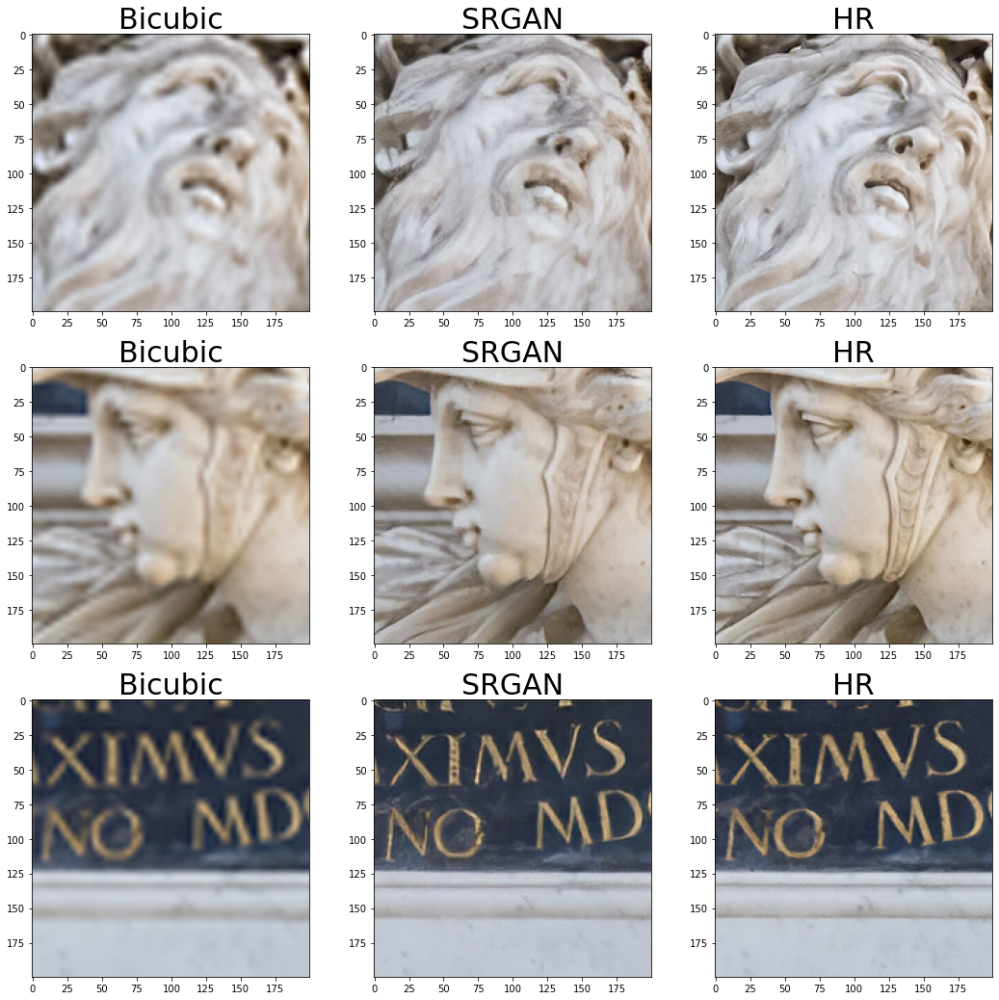

In [20]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(400,500), (300,1200), (0,1000)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 200, 200)
    img2 = crop(srgan_hr , left_top, 200, 200)
    img3 = crop(hr, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRGAN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

### Super Resolution 결과 평가하기

PSNR(Peak Signal-to-Noise Ratio): 영상 내 신호가 가질 수 있는 최대 신호에 대한 잡음의 비율,   
                                  일반적으로 영상을 압축했을 때 화질이 얼마나 손실되었는지 평가하는 항목   
                                  단위는 데시벨(db)을 사용하며, PSNR수치가 높을수록 손실이 적다는 의미   
SSIM(Structural Similarity Index Map): 영상의 구조 정보를 고려하여 얼마나 구조 정보를 변화시키지 않았는지를 계산   
                                       SSIM값이 높을수록 원본 영상에 가깝다.
                                       
scikit-image라이브러리를 이용해서 쉽게 계산 가능하다.

(300, 451, 3)


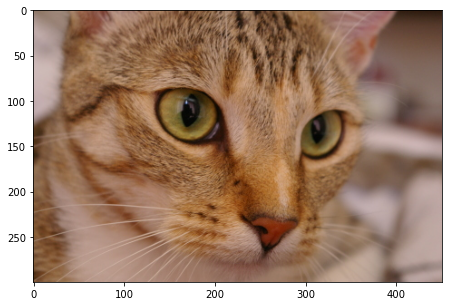

In [21]:
from skimage import data
import matplotlib.pyplot as plt

hr_cat = data.chelsea() # skimage에서 제공하는 예제 이미지를 불러옵니다.
hr_shape = hr_cat.shape[:2]

print(hr_cat.shape) # 이미지의 크기를 출력합니다.

plt.figure(figsize=(8,5))
plt.imshow(hr_cat)

In [22]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

print("**동일 이미지 비교**")
print("PSNR :", peak_signal_noise_ratio(hr_cat, hr_cat))
print("SSIM :", structural_similarity(hr_cat, hr_cat, multichannel=True))

# 동일한 이미지를 비교했으므로 각 수치들은 최댓값을 가진다.
# PSNR은 상한값이 없고, SSIM은 0 ~ 1 사이의 값을 가진다.

**동일 이미지 비교**
PSNR : inf
SSIM : 1.0


/home/aiffel0042/anaconda3/envs/aiffel/lib/python3.7/site-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


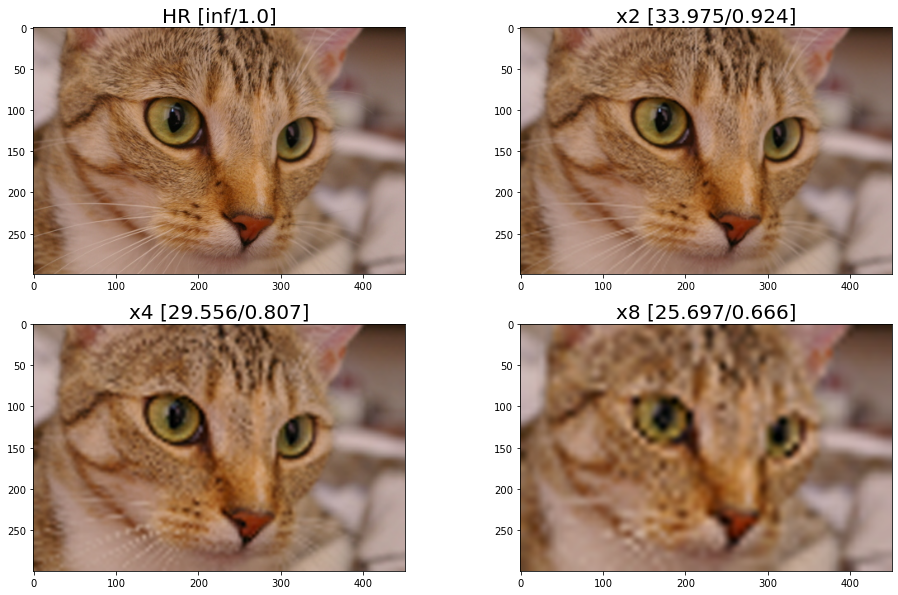

In [23]:
import cv2

# 이미지를 특정 크기로 줄이고 다시 늘리는 과정을 함수로 정의합니다.
def interpolation_xn(image, n):
    downsample = cv2.resize(
        image,
        dsize=(hr_shape[1]//n, hr_shape[0]//n)
    )
    upsample = cv2.resize(
        downsample,
        dsize=(hr_shape[1], hr_shape[0]),
        interpolation=cv2.INTER_CUBIC
    )
    return upsample

lr2_cat = interpolation_xn(hr_cat, 2) # 1/2로 줄이고 다시 복원
lr4_cat = interpolation_xn(hr_cat, 4) # 1/4로 줄이고 다시 복원
lr8_cat = interpolation_xn(hr_cat, 8) # 1/8로 줄이고 다시 복원

images = [hr_cat, lr2_cat, lr4_cat, lr8_cat]
titles = ["HR", "x2", "x4", "x8"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(hr_cat, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(hr_cat, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(16,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=20)

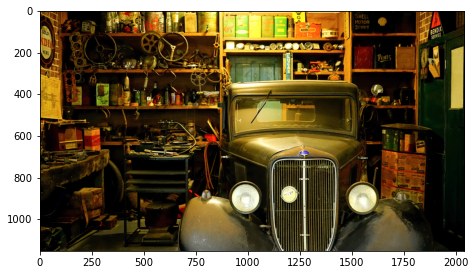

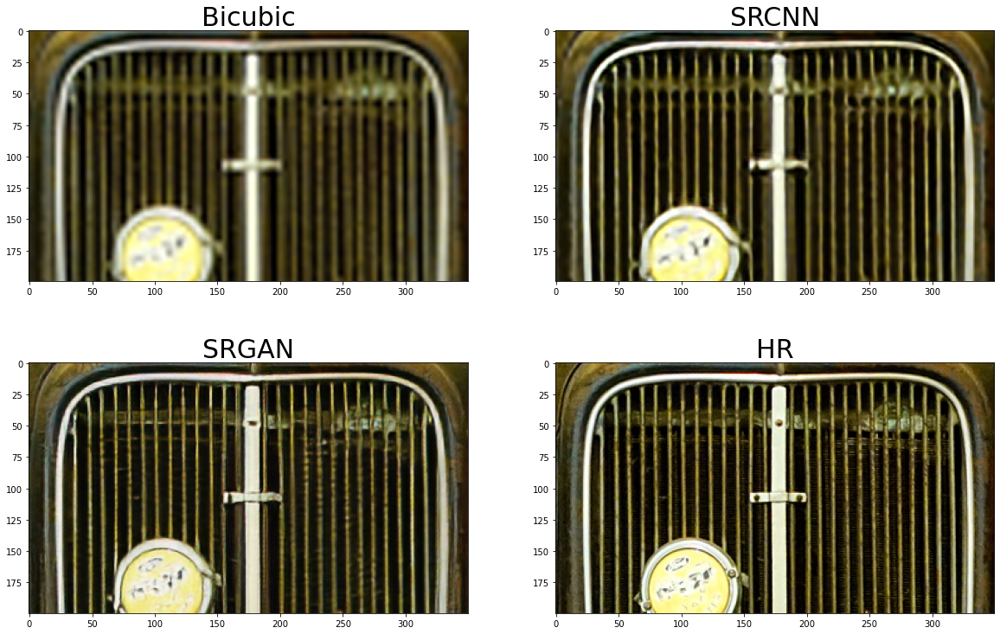

In [24]:
# SRCNN과 SRGAN 결과 비교하기
# div2k 데이터셋 내에서 학습에 사용하지 않은 검증용 데이터셋에서 몇 개의 이미지를 뽑아서
# Super Resolution을 진행한 후 특정 부분을 잘라 확대한다.

for i, (lr, hr) in enumerate(valid):
    if i == 12: break # 12번째 이미지를 불러옵니다.

lr_img, hr_img = np.array(lr), np.array(hr)

# bicubic interpolation
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

# 전체 이미지를 시각화합니다.
plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

# SRCNN을 이용해 고해상도로 변환합니다.
srcnn_img = apply_srcnn(bicubic_img)

# SRGAN을 이용해 고해상도로 변환합니다.
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (700, 1090) # 잘라낼 부분의 왼쪽 상단 좌표를 지정합니다.

# bicubic, SRCNN, SRGAN 을 적용한 이미지와 원래의 고해상도 이미지를 시각화합니다.
plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

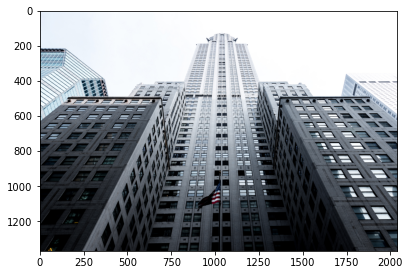

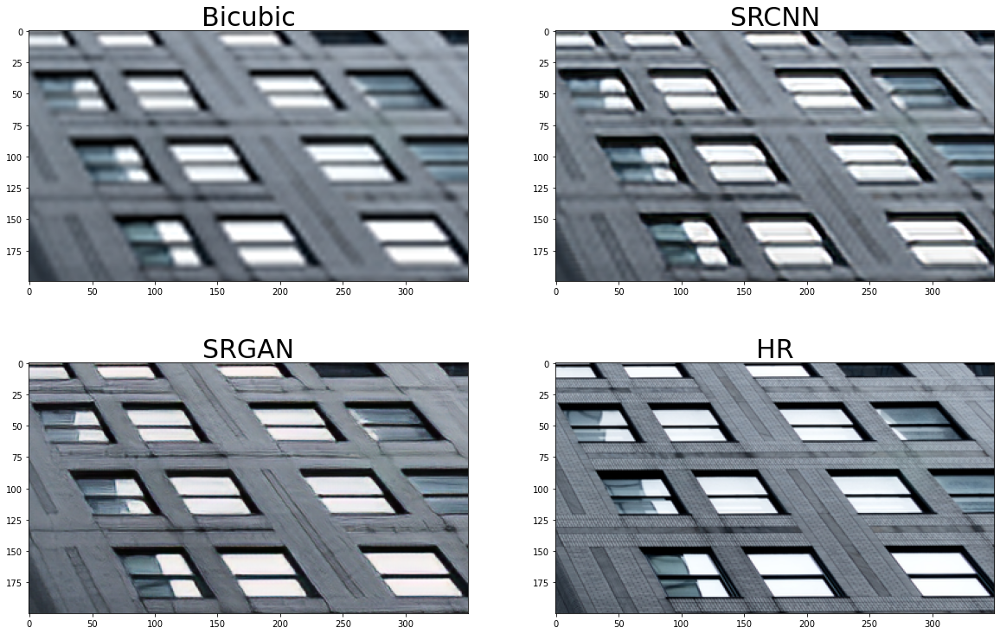

In [25]:
for i, (lr, hr) in enumerate(valid):
    if i == 15: break

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (600, 1500)

plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

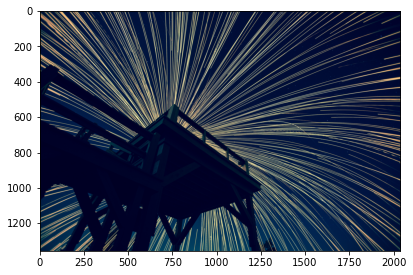

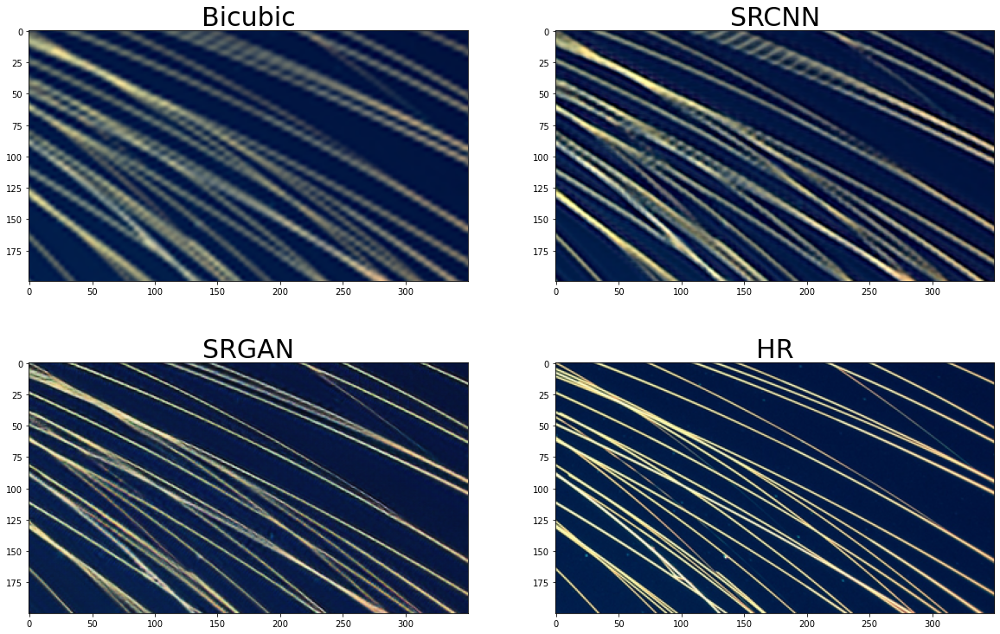

In [26]:
for i, (lr, hr) in enumerate(valid):
    if i == 8: break

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (900, 1500)

plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

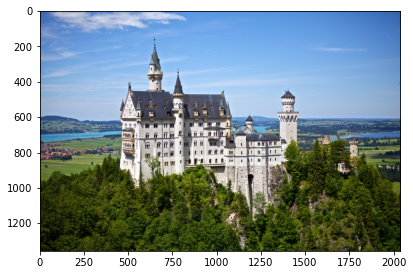

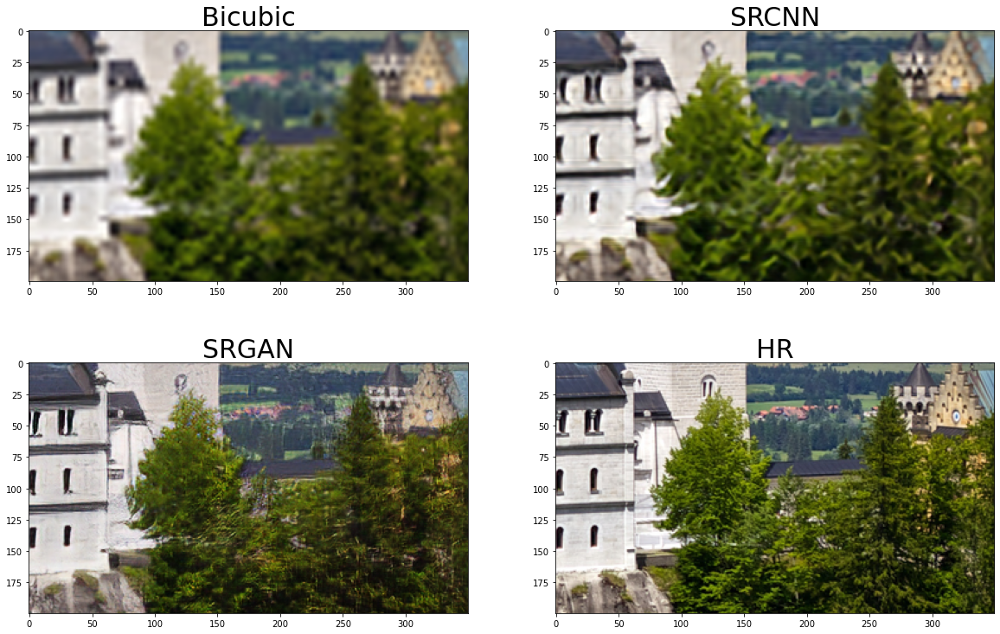

In [27]:
for i, (lr, hr) in enumerate(valid):
    if i == 24: break

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (700, 1300)

plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

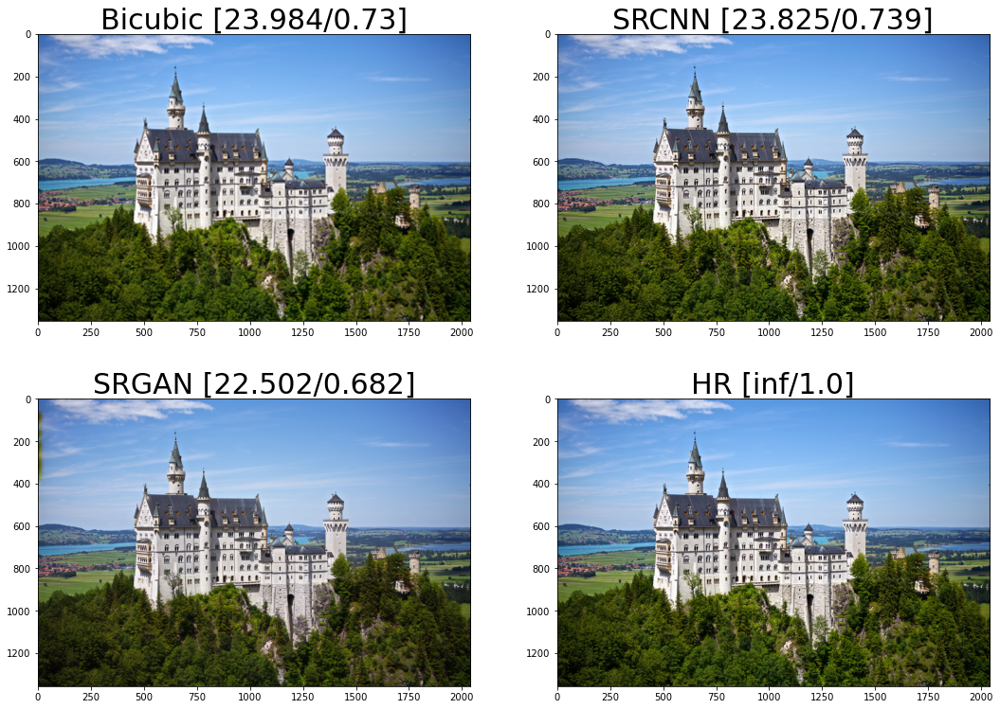

In [28]:
# 이제 PSNR, SSIM 계산하기

for i, (lr, hr) in enumerate(valid):
    if i == 24: break
    
lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img,
    (hr.shape[1], hr.shape[0]),
    interpolation=cv2.INTER_CUBIC
)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(hr_img, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(hr_img, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(18,13))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=30)

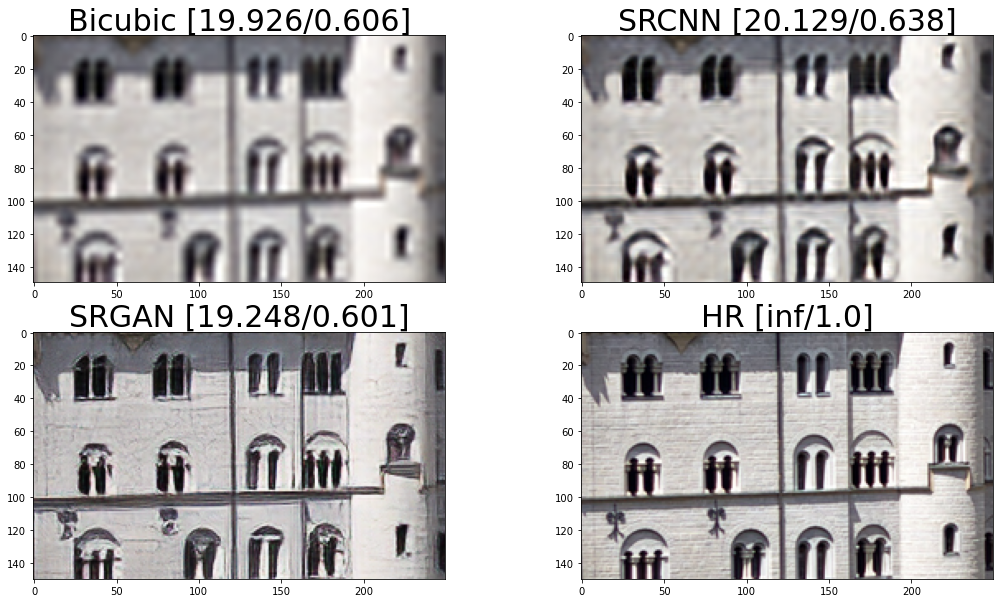

In [29]:
# 이미지에서 특정 부분을 잘라서 PSNR, SSIM를 계산하기

left_top = (620, 570)
crop_images = [crop(i, left_top, 150, 250) for i in images]

psnr = [round(peak_signal_noise_ratio(crop_images[-1], i), 3) for i in crop_images]
ssim = [round(structural_similarity(crop_images[-1], i, multichannel=True), 3) for i in crop_images]

plt.figure(figsize=(18,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(crop_images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=30)

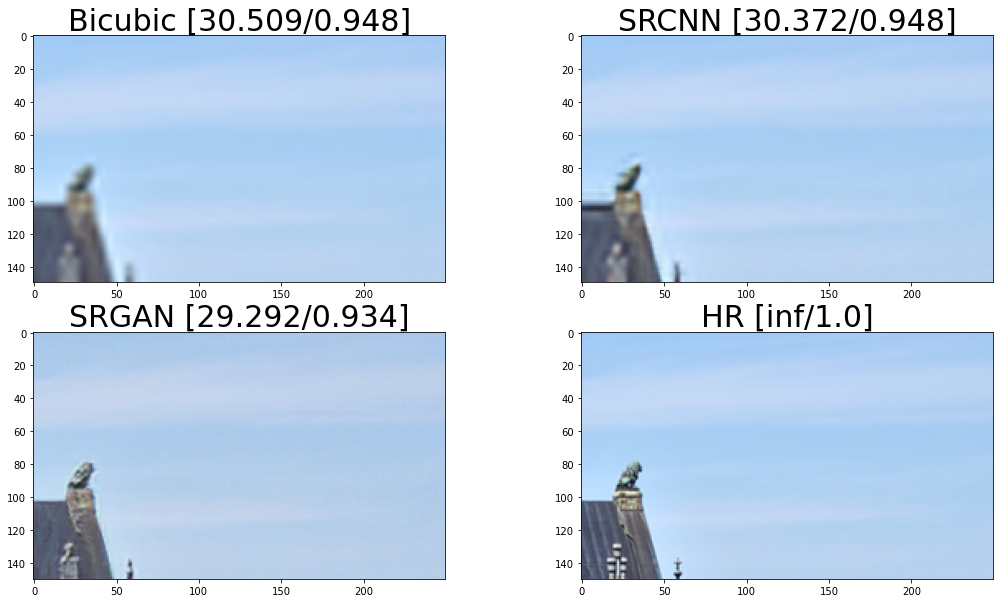

In [30]:
for i, (lr, hr) in enumerate(valid):
    # 불러올 이미지의 인덱스를 지정합니다.
    # 위에서 시각화 했던 8, 12, 15, 24 번을 제외한 다른 숫자를 넣어봅시다 
    if i == 79: 
        break          

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img,
    (hr.shape[1], hr.shape[0]),
    interpolation=cv2.INTER_CUBIC
)

# 확대할 부분의 왼쪽 상단 좌표를 지정합니다.
left_top = (369, 1004) 

# crop 함수 내의 세번째 네번째 인자를 수정해 이미지 크기를 조절합니다.
crop_images = [crop(i, left_top, 150, 250) for i in images] 
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

psnr = [round(peak_signal_noise_ratio(crop_images[-1], i), 3) for i in crop_images]
ssim = [round(structural_similarity(crop_images[-1], i, multichannel=True), 3) for i in crop_images]

plt.figure(figsize=(18,10)) # 이미지 크기를 조절할 수 있습니다.
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(crop_images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=30)

Super Resolution 다른 유형   
RefSR(Reference-based Super Resolution): 해상도를 높이는 데 참고할 만한 다른 이미지를 같이 제공해준다.   
                                         'Image Super-Resolution by Neural Texture Transfer'   
'Single Image Super Resolution using Deep Learning Overview'
https://hoya012.github.io/blog/SIngle-Image-Super-Resolution-Overview/

추가 자료
PR12 - SRCNN https://www.youtube.com/watch?v=1jGr_OFyfa0   
PR12 - SRGAN https://www.youtube.com/watch?v=nGPMKnoJTcI   
EDSR https://www.youtube.com/watch?v=OMIqkn2DCUk   
딥러닝 Super Resolution 어디까지 왔니? https://www.youtube.com/watch?v=nvsYKSHw0jo   